<a href="https://colab.research.google.com/github/AngelTianzy/sph6004-project-1/blob/main/finalised.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#data preparation

In [1]:
# We will use the following packages

# NumPy for math operations, and Pandas for processing tabular data.
import numpy as np
import pandas as pd

# Plotly plotting package
import plotly.graph_objects as go
import plotly.express as px

# PyTorch package and submodules
import torch
import torch.nn as nn
from torch.optim import SGD #gradient descent optimizer

# We use AUROC and average precision (AP) scores from sklearn
from sklearn.metrics import roc_auc_score, average_precision_score

# Tools in sklearn to select best model
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV

# Decision tree classifier in sklearn
from sklearn.tree import DecisionTreeClassifier as DTC, plot_tree

# We use f1 score to test model performance
from sklearn.metrics import f1_score

# Import matplotlib.pyplot to visualize tree models
import matplotlib.pyplot as plt

#perform simple imputation in Python using the SimpleImputer class from sklearn.impute
from sklearn.impute import SimpleImputer


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Load dataset
from google.colab import drive
drive.mount('/content/drive')

file_path = '/content/drive/My Drive/sph6004_assignment1_data.csv'
df = pd.read_csv(file_path)

# Display the first few rows of the dataframe
print(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
         id  aki gender  admission_age                    race  \
0  36570066    3      F      79.953141  BLACK/AFRICAN AMERICAN   
1  39307659    0      F      78.194169         WHITE - RUSSIAN   
2  38743306    2      F      65.602396                   WHITE   
3  32339865    2      F      64.906629                 UNKNOWN   
4  35526987    2      M      57.438861                   WHITE   

   heart_rate_min  heart_rate_max  heart_rate_mean  sbp_min  sbp_max  ...  \
0            96.0           104.0       100.083333    103.0    126.0  ...   
1            72.0           134.0        97.263158     97.0    127.0  ...   
2            60.0            97.0        84.166667     95.0    143.0  ...   
3            59.0            87.0        71.461538    113.0    150.0  ...   
4            57.0           100.0        82.387097     81.0    127.0  ...   

   ggt_max 

target binary classification

In [4]:
# Convert the 'aki' column into a binary classification, defining kidney failure as AKI Stage 3
df['aki_binary'] = df['aki'].apply(lambda x: 0 if x == 0 else 1)

# Display the first few rows to confirm the transformation
df[['aki', 'aki_binary']].head()
df['aki_binary'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 50920 entries, 0 to 50919
Series name: aki_binary
Non-Null Count  Dtype
--------------  -----
50920 non-null  int64
dtypes: int64(1)
memory usage: 397.9 KB


non-numeric

In [5]:
# Display the non-numeric columns from the original dataset
non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
df[non_numeric_columns].head()

,gender,race
0,F,BLACK/AFRICAN AMERICAN
1,F,WHITE - RUSSIAN
2,F,WHITE
3,F,UNKNOWN
4,M,WHITE


Race encoding

In [6]:
#categories
unique_race_categories = df['race'].unique()
print(unique_race_categories.tolist())

['BLACK/AFRICAN AMERICAN', 'WHITE - RUSSIAN', 'WHITE', 'UNKNOWN', 'ASIAN', 'OTHER', 'HISPANIC OR LATINO', 'UNABLE TO OBTAIN', 'WHITE - OTHER EUROPEAN', 'ASIAN - CHINESE', 'PATIENT DECLINED TO ANSWER', 'ASIAN - KOREAN', 'BLACK/AFRICAN', 'MULTIPLE RACE/ETHNICITY', 'WHITE - EASTERN EUROPEAN', 'HISPANIC/LATINO - PUERTO RICAN', 'BLACK/CARIBBEAN ISLAND', 'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER', 'BLACK/CAPE VERDEAN', 'HISPANIC/LATINO - SALVADORAN', 'WHITE - BRAZILIAN', 'HISPANIC/LATINO - DOMINICAN', 'PORTUGUESE', 'ASIAN - SOUTH EAST ASIAN', 'SOUTH AMERICAN', 'HISPANIC/LATINO - MEXICAN', 'ASIAN - ASIAN INDIAN', 'HISPANIC/LATINO - GUATEMALAN', 'HISPANIC/LATINO - HONDURAN', 'HISPANIC/LATINO - CUBAN', 'AMERICAN INDIAN/ALASKA NATIVE', 'HISPANIC/LATINO - CENTRAL AMERICAN', 'HISPANIC/LATINO - COLUMBIAN']


In [8]:
# Define a mapping from 5 specific categories to broader groups
race_groups = {
    'BLACK/AFRICAN AMERICAN': 'Black/African American',
    'WHITE - RUSSIAN': 'White',
    'WHITE': 'White',
    'UNKNOWN': 'Other',
    'ASIAN': 'Asian',
    'OTHER': 'Other',
    'HISPANIC OR LATINO': 'Hispanic/Latino',
    'UNABLE TO OBTAIN': 'Other',
    'WHITE - OTHER EUROPEAN': 'White',
    'ASIAN - CHINESE': 'Asian',
    'PATIENT DECLINED TO ANSWER': 'Other',
    'ASIAN - KOREAN': 'Asian',
    'BLACK/AFRICAN': 'Black/African American',
    'MULTIPLE RACE/ETHNICITY': 'Other',
    'WHITE - EASTERN EUROPEAN': 'White',
    'HISPANIC/LATINO - PUERTO RICAN': 'Hispanic/Latino',
    'BLACK/CARIBBEAN ISLAND': 'Black/African American',
    'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER': 'Other',
    'BLACK/CAPE VERDEAN': 'Black/African American',
    'HISPANIC/LATINO - SALVADORAN': 'Hispanic/Latino',
   'WHITE - BRAZILIAN': 'White',
    'HISPANIC/LATINO - DOMINICAN': 'Hispanic/Latino',
    'PORTUGUESE':'Other',
    'ASIAN - SOUTH EAST ASIAN': 'Asian',
    'SOUTH AMERICAN':'Other',
    'HISPANIC/LATINO - MEXICAN': 'Hispanic/Latino',
    'ASIAN - ASIAN INDIAN': 'Asian',
    'HISPANIC/LATINO - GUATEMALAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - HONDURAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - CUBAN': 'Hispanic/Latino',
    'AMERICAN INDIAN/ALASKA NATIVE':'Other',
    'HISPANIC/LATINO - CENTRAL AMERICAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - COLUMBIAN': 'Hispanic/Latino'}


# Apply the mapping to consolidate categories
df['race_cat'] = df['race'].map(race_groups)

# Handle any categories not explicitly mapped
df['race_cat'].fillna('Other', inplace=True)

# # Convert 'race' into a categorical numeric variable
df['race_encoded'] = pd.factorize(df['race_cat'])[0]


In [9]:
df['race_encoded'].head()
unique_race_encoded = df['race_encoded'].unique()
print(unique_race_encoded.tolist())

[0, 1, 2, 3, 4]


In [84]:
# Convert 'race' into a categorical numeric variable
codes, uniques = pd.factorize(df['race_cat'])

# Assign the encoded variable back to the DataFrame
df['race_encoded'] = codes

# Create a mapping from the encoded number to the category
encoding_map = dict(enumerate(uniques))

# Print the mapping
print(encoding_map)


{0: 'Black/African American', 1: 'White', 2: 'Other', 3: 'Asian', 4: 'Hispanic/Latino'}


  Gender encoding

In [10]:
# Convert 'gender' into a categorical numeric variable
df['gender'] = df['gender'].replace({'F': 1, 'M': 0})
# Display the first few rows to confirm the transformation
df[['gender']].head()

,gender
0,1
1,1
2,1
3,1
4,0


one hot encoding

In [11]:
#reduce the number of categories

#gcs_min, common for determining the severity based on the Glasgow Coma Scale, where a lower score indicates a more severe condition
def gcs_min_cat(score):
    if pd.isnull(score):
        return np.nan  # Keep NaN values as NaN
    threshold = 8
    if score <= threshold:
        return 0
    else:
        return 1

df['gcs_min_cat'] = df['gcs_min'].apply(gcs_min_cat)

#gcs_motor
def gcs_motor_cat(score):
    if pd.isnull(score):
        return np.nan  # Preserves NaN values
    threshold = 5
    if score <= threshold:
        return 0  # More severe condition
    else:
        return 1  # Less severe condition

df['gcs_motor_cat'] = df['gcs_motor'].apply(gcs_motor_cat)

#gcs_verbal
def gcs_verbal_cat(score):
    if pd.isnull(score):
        return np.nan  # Preserves NaN values
    threshold = 4
    if score <= threshold:
        return 0  # Indicates more severe condition
    else:
        return 1  # Indicates less severe condition

df['gcs_verbal_cat'] = df['gcs_verbal'].apply(gcs_verbal_cat)



#gcs_eyes
def gcs_eyes_cat(score):
    if score in [1, 2]:
        return 0  # Group 1-2 as 0
    elif score in [3, 4]:
        return 1  # Group 3-4 as 1
    else:
        return None  # Handle unexpected values

# Apply the function to create a new column with numeric categories
df['gcs_eyes_cat'] = df['gcs_eyes'].apply(gcs_eyes_cat)


In [12]:
df_encoded = pd.get_dummies(df, columns=['gender', 'race_encoded', 'gcs_min_cat', 'gcs_motor_cat', 'gcs_verbal_cat',
                                         'gcs_eyes_cat', 'gcs_unable'], prefix=['gender', 'race_encoded', 'gcs_min_cat', 'gcs_motor_cat', 'gcs_verbal_cat',
                                         'gcs_eyes_cat', 'gcs_unable'])

In [13]:

df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Columns: 179 entries, id to gcs_unable_1.0
dtypes: float64(157), int64(3), object(2), uint8(17)
memory usage: 63.8+ MB


#Target and features in refined dataset

features

In [14]:

# List of columns intended to drop
X_columns_to_drop_full = ['aki_binary', 'aki', 'id', 'race', 'race_cat'] #remove targets, id, non-numeric

X_df_full = df_encoded.drop(columns=X_columns_to_drop_full, axis=1)

pd.set_option('display.max_info_columns', 500)
X_df_full.info()
X_df_full.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 174 columns):
 #    Column                  Non-Null Count  Dtype  
---   ------                  --------------  -----  
 0    admission_age           50920 non-null  float64
 1    heart_rate_min          50841 non-null  float64
 2    heart_rate_max          50841 non-null  float64
 3    heart_rate_mean         50841 non-null  float64
 4    sbp_min                 50823 non-null  float64
 5    sbp_max                 50823 non-null  float64
 6    sbp_mean                50823 non-null  float64
 7    dbp_min                 50823 non-null  float64
 8    dbp_max                 50823 non-null  float64
 9    dbp_mean                50823 non-null  float64
 10   mbp_min                 50805 non-null  float64
 11   mbp_max                 50805 non-null  float64
 12   mbp_mean                50805 non-null  float64
 13   resp_rate_min           50777 non-null  float64
 14   resp_rate_max       

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,gcs_min_cat_0.0,gcs_min_cat_1.0,gcs_motor_cat_0.0,gcs_motor_cat_1.0,gcs_verbal_cat_0.0,gcs_verbal_cat_1.0,gcs_eyes_cat_0.0,gcs_eyes_cat_1.0,gcs_unable_0.0,gcs_unable_1.0
0,79.953141,96.0,104.0,100.083333,103.0,126.0,116.136364,40.0,58.0,47.863636,...,0,1,0,1,0,1,0,1,1,0
1,78.194169,72.0,134.0,97.263158,97.0,127.0,109.833333,56.0,89.0,70.166667,...,0,1,0,1,0,1,0,1,1,0
2,65.602396,60.0,97.0,84.166667,95.0,143.0,112.153846,56.0,99.0,73.307692,...,0,1,0,1,0,1,0,1,1,0


Remove outliers among continuous variables

In [15]:
# check for outliers among continuous variables by dropping categorical columns
X_df_full_columns_to_drop = ['gender_0','gender_1', 'race_encoded_0', 'race_encoded_1', 'race_encoded_2', 'race_encoded_3', 'race_encoded_4',
                             'gcs_min_cat_0.0','gcs_min_cat_1.0', 'gcs_motor_cat_0.0', 'gcs_motor_cat_1.0', 'gcs_verbal_cat_0.0', 'gcs_verbal_cat_1.0',
                             'gcs_eyes_cat_0.0', 'gcs_eyes_cat_1.0', 'gcs_unable_0.0', 'gcs_unable_1.0'  ]

X_df_full_cts = X_df_full.drop(columns=X_df_full_columns_to_drop, axis=1)

pd.set_option('display.max_info_columns', 500)
X_df_full_cts.info()
X_df_full_cts.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 157 columns):
 #    Column                  Non-Null Count  Dtype  
---   ------                  --------------  -----  
 0    admission_age           50920 non-null  float64
 1    heart_rate_min          50841 non-null  float64
 2    heart_rate_max          50841 non-null  float64
 3    heart_rate_mean         50841 non-null  float64
 4    sbp_min                 50823 non-null  float64
 5    sbp_max                 50823 non-null  float64
 6    sbp_mean                50823 non-null  float64
 7    dbp_min                 50823 non-null  float64
 8    dbp_max                 50823 non-null  float64
 9    dbp_mean                50823 non-null  float64
 10   mbp_min                 50805 non-null  float64
 11   mbp_max                 50805 non-null  float64
 12   mbp_mean                50805 non-null  float64
 13   resp_rate_min           50777 non-null  float64
 14   resp_rate_max       

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,ggt_min,ggt_max,ld_ldh_min,ld_ldh_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,height,weight_admit
0,79.953141,96.0,104.0,100.083333,103.0,126.0,116.136364,40.0,58.0,47.863636,...,NaN,NaN,236.0,318.0,15.0,6.0,5.0,4.0,157.0,110.0
1,78.194169,72.0,134.0,97.263158,97.0,127.0,109.833333,56.0,89.0,70.166667,...,NaN,NaN,NaN,NaN,15.0,6.0,5.0,4.0,NaN,82.0
2,65.602396,60.0,97.0,84.166667,95.0,143.0,112.153846,56.0,99.0,73.307692,...,NaN,NaN,NaN,NaN,15.0,6.0,5.0,4.0,NaN,62.1


In [16]:
X_df_full.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
admission_age,50920.0,64.942008,17.278264,18.002527,54.503884,66.713334,78.151289,102.865603
heart_rate_min,50841.0,69.902996,15.141810,1.000000,60.000000,69.000000,79.000000,167.000000
heart_rate_max,50841.0,102.494951,20.481365,36.000000,88.000000,100.000000,114.000000,280.000000
heart_rate_mean,50841.0,84.266427,15.726366,28.500000,73.229167,82.769231,94.080000,174.740741
sbp_min,50823.0,93.250232,17.550959,0.108000,83.000000,92.000000,103.000000,195.000000
...,...,...,...,...,...,...,...,...
gcs_verbal_cat_1.0,50920.0,0.531874,0.498988,0.000000,0.000000,1.000000,1.000000,1.000000
gcs_eyes_cat_0.0,50920.0,0.217125,0.412292,0.000000,0.000000,0.000000,0.000000,1.000000
gcs_eyes_cat_1.0,50920.0,0.775452,0.417289,0.000000,1.000000,1.000000,1.000000,1.000000
gcs_unable_0.0,50920.0,0.790691,0.406819,0.000000,1.000000,1.000000,1.000000,1.000000


In [17]:
# Loop through each column to apply the IQR filter
for column in X_df_full_cts:
    Q1 = X_df_full_cts[column].quantile(0.25)
    Q3 = X_df_full_cts[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Update X_df to filter out the outliers for the current column
    X_df_full_cts_filtered = X_df_full_cts[(X_df_full_cts[column] >= lower_bound) & (X_df_full_cts[column] <= upper_bound)]

pd.set_option('display.max_info_columns', 500)
X_df_full_cts_filtered.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,65.156896,17.314023,18.002527,54.742931,67.012482,78.440592,102.865603
heart_rate_min,48456.0,69.710170,15.058966,1.000000,60.000000,68.000000,79.000000,163.000000
heart_rate_max,48456.0,102.367220,20.432294,36.000000,88.000000,100.000000,114.000000,280.000000
heart_rate_mean,48456.0,84.097925,15.657135,28.500000,73.111111,82.615385,93.818182,174.740741
sbp_min,48449.0,93.207725,17.515906,0.108000,83.000000,92.000000,103.000000,184.000000
...,...,...,...,...,...,...,...,...
gcs_motor,47953.0,5.164348,1.666865,1.000000,5.000000,6.000000,6.000000,6.000000
gcs_verbal,48087.0,3.381558,2.089287,0.000000,1.000000,5.000000,5.000000,5.000000
gcs_eyes,48214.0,3.120152,1.107790,1.000000,3.000000,4.000000,4.000000,4.000000
height,24136.0,169.399233,10.609328,122.000000,163.000000,170.000000,178.000000,226.000000


normalisation

In [18]:
#normalisation for continuous variables
X_df_full_cts_filtered_norm = (X_df_full_cts_filtered-X_df_full_cts_filtered.mean())/X_df_full_cts_filtered.std()

pd.set_option('display.max_info_rows', 500)
X_df_full_cts_filtered_norm.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.790262e-17,1.0,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_min,48456.0,-1.859353e-16,1.0,-4.562742,-0.644810,-0.113565,0.616897,6.194969
heart_rate_max,48456.0,-3.245070e-16,1.0,-3.248153,-0.703162,-0.115857,0.569333,8.693727
heart_rate_mean,48456.0,-1.173094e-17,1.0,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_min,48449.0,5.331014e-16,1.0,-5.315153,-0.582769,-0.068950,0.559050,5.183419
...,...,...,...,...,...,...,...,...
gcs_motor,47953.0,7.327245e-17,1.0,-2.498311,-0.098597,0.501331,0.501331,0.501331
gcs_verbal,48087.0,3.162105e-17,1.0,-1.618523,-1.139891,0.774638,0.774638,0.774638
gcs_eyes,48214.0,-1.750051e-16,1.0,-1.913857,-0.108461,0.794237,0.794237,0.794237
height,24136.0,1.689806e-16,1.0,-4.467694,-0.603170,0.056626,0.810680,5.335000


Feature concatenation: X_df_full_cts_filtered_norm +categorical

In [19]:
# Concatenate for  alignment
X_df_full_filtered_norm = pd.concat([X_df_full_cts_filtered_norm, X_df_full['gender_0'], X_df_full['gender_1'],
                                     X_df_full['race_encoded_0'], X_df_full['race_encoded_1'], X_df_full['race_encoded_2'], X_df_full['race_encoded_3'], X_df_full['race_encoded_4'],
                                     X_df_full['gcs_eyes_cat_0.0'], X_df_full['gcs_eyes_cat_1.0'],
                                    X_df_full['gcs_min_cat_0.0'], X_df_full['gcs_min_cat_1.0'],
                                     X_df_full['gcs_motor_cat_0.0'], X_df_full['gcs_motor_cat_1.0'],
                                     X_df_full['gcs_verbal_cat_0.0'], X_df_full['gcs_verbal_cat_1.0'],
                                    X_df_full['gcs_unable_0.0'], X_df_full['gcs_unable_1.0']
                                    ], axis=1)

# Verify alignment by checking the first few rows
X_df_full_filtered_norm.info()
X_df_full_filtered_norm.describe().transpose()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50920 entries, 0 to 50848
Data columns (total 174 columns):
 #    Column                  Dtype  
---   ------                  -----  
 0    admission_age           float64
 1    heart_rate_min          float64
 2    heart_rate_max          float64
 3    heart_rate_mean         float64
 4    sbp_min                 float64
 5    sbp_max                 float64
 6    sbp_mean                float64
 7    dbp_min                 float64
 8    dbp_max                 float64
 9    dbp_mean                float64
 10   mbp_min                 float64
 11   mbp_max                 float64
 12   mbp_mean                float64
 13   resp_rate_min           float64
 14   resp_rate_max           float64
 15   resp_rate_mean          float64
 16   temperature_min         float64
 17   temperature_max         float64
 18   temperature_mean        float64
 19   spo2_min                float64
 20   spo2_max                float64
 21   spo2_mean 

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_min,48456.0,-1.853488e-16,1.000000,-4.562742,-0.644810,-0.113565,0.616897,6.194969
heart_rate_max,48456.0,-3.246536e-16,1.000000,-3.248153,-0.703162,-0.115857,0.569333,8.693727
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_min,48449.0,5.332480e-16,1.000000,-5.315153,-0.582769,-0.068950,0.559050,5.183419
...,...,...,...,...,...,...,...,...
gcs_motor_cat_1.0,50920.0,7.184603e-01,0.449754,0.000000,0.000000,1.000000,1.000000,1.000000
gcs_verbal_cat_0.0,50920.0,4.580518e-01,0.498242,0.000000,0.000000,0.000000,1.000000,1.000000
gcs_verbal_cat_1.0,50920.0,5.318735e-01,0.498988,0.000000,0.000000,1.000000,1.000000,1.000000
gcs_unable_0.0,50920.0,7.906913e-01,0.406819,0.000000,1.000000,1.000000,1.000000,1.000000


target, no missing values in target

In [20]:
y_df_full = df_encoded.loc[df.index, 'aki_binary']
y_df_full.info()

<class 'pandas.core.series.Series'>
Int64Index: 50920 entries, 0 to 50919
Series name: aki_binary
Non-Null Count  Dtype
--------------  -----
50920 non-null  int64
dtypes: int64(1)
memory usage: 795.6 KB


In [21]:
unique_aki_binary = df['aki_binary'].unique()
print(unique_aki_binary.tolist())

[1, 0]


# feature engineering and selection

Correlation check:
min, max and mean of a variable are highly correlated

In [29]:
round(X_df_full_filtered_norm.apply(X_df_full_filtered_norm.corrwith),2)

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,gcs_eyes_cat_0.0,gcs_eyes_cat_1.0,gcs_min_cat_0.0,gcs_min_cat_1.0,gcs_motor_cat_0.0,gcs_motor_cat_1.0,gcs_verbal_cat_0.0,gcs_verbal_cat_1.0,gcs_unable_0.0,gcs_unable_1.0
admission_age,1.00,-0.17,-0.16,-0.18,-0.10,0.12,0.03,-0.31,-0.04,-0.31,...,0.02,-0.02,0.05,-0.05,0.05,-0.05,0.10,-0.10,0.03,-0.03
heart_rate_min,-0.17,1.00,0.60,0.87,0.00,-0.10,-0.07,0.16,0.07,0.18,...,-0.04,0.04,-0.02,0.02,-0.02,0.02,-0.01,0.01,0.02,-0.02
heart_rate_max,-0.16,0.60,1.00,0.84,-0.15,0.03,-0.09,0.05,0.17,0.18,...,0.05,-0.05,0.03,-0.03,0.07,-0.07,0.09,-0.09,-0.05,0.05
heart_rate_mean,-0.18,0.87,0.84,1.00,-0.10,-0.05,-0.10,0.11,0.12,0.20,...,0.02,-0.03,0.02,-0.02,0.04,-0.05,0.06,-0.06,-0.03,0.03
sbp_min,-0.10,0.00,-0.15,-0.10,1.00,0.37,0.77,0.58,0.21,0.48,...,-0.18,0.18,-0.06,0.06,-0.18,0.18,-0.15,0.15,0.20,-0.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gcs_motor_cat_1.0,-0.05,0.02,-0.07,-0.05,0.18,-0.05,0.09,0.12,0.05,0.11,...,-0.77,0.79,-0.42,0.43,-0.97,1.00,-0.61,0.63,0.55,-0.53
gcs_verbal_cat_0.0,0.10,-0.01,0.09,0.06,-0.15,0.11,-0.03,-0.12,0.01,-0.10,...,0.55,-0.53,0.29,-0.26,0.62,-0.61,1.00,-0.98,-0.54,0.55
gcs_verbal_cat_1.0,-0.10,0.01,-0.09,-0.06,0.15,-0.11,0.04,0.12,-0.00,0.10,...,-0.55,0.56,-0.28,0.29,-0.62,0.63,-0.98,1.00,0.55,-0.54
gcs_unable_0.0,0.03,0.02,-0.05,-0.03,0.20,0.01,0.15,0.10,0.12,0.14,...,-0.55,0.56,0.14,-0.10,-0.53,0.55,-0.54,0.55,1.00,-0.99


In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame to only min, max and mean columns
min_max_mean_columns = [col for col in X_df_full_filtered_norm.columns if '_min' in col or '_max' in col or '_mean' in col]
filtered_df = X_df_full_filtered_norm[min_max_mean_columns]

# Calculate the correlation matrix
corr = filtered_df.corr()

# Create a heatmap
plt.figure(figsize=(120, 100))
sns.heatmap(corr, annot=True, vmin=-1, vmax=1,fmt=".2f")
plt.show()


 Inclusion of additional difference(max-min) columns

In [31]:
print(X_df_full_filtered_norm.columns.tolist())

['admission_age', 'heart_rate_min', 'heart_rate_max', 'heart_rate_mean', 'sbp_min', 'sbp_max', 'sbp_mean', 'dbp_min', 'dbp_max', 'dbp_mean', 'mbp_min', 'mbp_max', 'mbp_mean', 'resp_rate_min', 'resp_rate_max', 'resp_rate_mean', 'temperature_min', 'temperature_max', 'temperature_mean', 'spo2_min', 'spo2_max', 'spo2_mean', 'glucose_min', 'glucose_max', 'glucose_mean', 'lactate_min', 'lactate_max', 'ph_min', 'ph_max', 'so2_min', 'so2_max', 'po2_min', 'po2_max', 'pco2_min', 'pco2_max', 'aado2_min', 'aado2_max', 'aado2_calc_min', 'aado2_calc_max', 'pao2fio2ratio_min', 'pao2fio2ratio_max', 'baseexcess_min', 'baseexcess_max', 'bicarbonate_min', 'bicarbonate_max', 'totalco2_min', 'totalco2_max', 'hematocrit_min', 'hematocrit_max', 'hemoglobin_min', 'hemoglobin_max', 'carboxyhemoglobin_min', 'carboxyhemoglobin_max', 'methemoglobin_min', 'methemoglobin_max', 'temperature_min.1', 'temperature_max.1', 'chloride_min', 'chloride_max', 'calcium_min', 'calcium_max', 'glucose_min.1', 'glucose_max.1', 'p

In [22]:
# Define the pairs of features to calculate the difference
features_pairs = [
    ('heart_rate_min', 'heart_rate_max'),
    ('sbp_min', 'sbp_max'),
   ('dbp_min', 'dbp_max'),
    ('mbp_min', 'mbp_max'),
('resp_rate_min', 'resp_rate_max'),
    ('temperature_min', 'temperature_max'),
('spo2_min', 'spo2_max'),
    ('glucose_min', 'glucose_max'),
('lactate_min', 'lactate_max'),
    ('ph_min', 'ph_max'),
('so2_min', 'so2_max'),
    ('po2_min', 'po2_max'),
('pco2_min', 'pco2_max'),
    ('aado2_min', 'aado2_max'),
('aado2_calc_min', 'aado2_calc_max'),
    ('pao2fio2ratio_min', 'pao2fio2ratio_max'),
('baseexcess_min', 'baseexcess_max'),
    ('bicarbonate_min', 'bicarbonate_max'),
('totalco2_min', 'totalco2_max'),
    ('hematocrit_min', 'hematocrit_max'),
('hemoglobin_min', 'hemoglobin_max'),

     ('carboxyhemoglobin_min', 'carboxyhemoglobin_max'), ('methemoglobin_min', 'methemoglobin_max'),
                ('temperature_min.1', 'temperature_max.1'), ('chloride_min', 'chloride_max'), ('calcium_min', 'calcium_max'),
                ('glucose_min.1', 'glucose_max.1'), ('potassium_min', 'potassium_max'), ('sodium_min', 'sodium_max'), ('hematocrit_min.1', 'hematocrit_max.1'),
                ('hemoglobin_min.1', 'hemoglobin_max.1'), ('platelets_min', 'platelets_max'), ('wbc_min', 'wbc_max'), ('albumin_min', 'albumin_max'),
                ('globulin_min', 'globulin_max'), ('total_protein_min', 'total_protein_max'), ('aniongap_min', 'aniongap_max'),
                ('bicarbonate_min.1', 'bicarbonate_max.1'), ('bun_min', 'bun_max'), ('calcium_min.1', 'calcium_max.1'),
                ('chloride_min.1', 'chloride_max.1'), ('glucose_min.2', 'glucose_max.2'), ('sodium_min.1', 'sodium_max.1'),
                ('potassium_min.1', 'potassium_max.1'), ('abs_basophils_min', 'abs_basophils_max'), ('abs_eosinophils_min', 'abs_eosinophils_max'),
                ('abs_lymphocytes_min', 'abs_lymphocytes_max'), ('abs_monocytes_min', 'abs_monocytes_max'), ('abs_neutrophils_min', 'abs_neutrophils_max'),
                ('atyps_min', 'atyps_max'), ('bands_min', 'bands_max'), ('imm_granulocytes_min', 'imm_granulocytes_max'), ('metas_min', 'metas_max'),
                ('nrbc_min', 'nrbc_max'), ('d_dimer_min', 'd_dimer_max'), ('fibrinogen_min', 'fibrinogen_max'), ('thrombin_min', 'thrombin_max'),
                ('inr_min', 'inr_max'), ('pt_min', 'pt_max'), ('ptt_min', 'ptt_max'), ('alt_min', 'alt_max'), ('alp_min', 'alp_max'),

    ('ast_min', 'ast_max'),
    ('amylase_min', 'amylase_max'),
    ('bilirubin_total_min', 'bilirubin_total_max'),
     ('bilirubin_direct_min', 'bilirubin_direct_max'),
('bilirubin_indirect_min', 'bilirubin_indirect_max'),
('ck_cpk_min', 'ck_cpk_max'),
('ck_mb_min', 'ck_mb_max'),
    ('ggt_min', 'ggt_max'),
    ('ld_ldh_min', 'ld_ldh_max')
]

In [23]:
# Loop through each pair and calculate the difference
for min_col, max_col in features_pairs:
    diff_col_name = f"{min_col}_to_{max_col}_diff"
    X_df_full_filtered_norm[diff_col_name] = X_df_full_filtered_norm[max_col] - X_df_full_filtered_norm[min_col]


In [24]:
X_df_full_filtered_norm.head(30)
X_df_full_filtered_norm.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_min,48456.0,-1.853488e-16,1.000000,-4.562742,-0.644810,-0.113565,0.616897,6.194969
heart_rate_max,48456.0,-3.246536e-16,1.000000,-3.248153,-0.703162,-0.115857,0.569333,8.693727
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_min,48449.0,5.332480e-16,1.000000,-5.315153,-0.582769,-0.068950,0.559050,5.183419
...,...,...,...,...,...,...,...,...
bilirubin_indirect_min_to_bilirubin_indirect_max_diff,1980.0,4.014746e-17,0.242754,-0.477940,-0.074462,-0.057334,-0.047818,3.692948
ck_cpk_min_to_ck_cpk_max_diff,15030.0,-1.938274e-17,0.448719,-12.038458,-0.010010,0.003106,0.007868,22.817574
ck_mb_min_to_ck_mb_max_diff,13773.0,-5.158954e-18,0.591661,-6.841470,-0.067930,-0.047650,-0.027370,8.095306
ggt_min_to_ggt_max_diff,453.0,3.161562e-17,0.008615,-0.003688,-0.001056,-0.000972,-0.000946,0.114489


Removal of min and max columns

In [25]:
# Create a list to hold columns to remove
columns_to_remove = []

# Add min and max columns to the list
for min_col, max_col in features_pairs:
    columns_to_remove.append(min_col)
    columns_to_remove.append(max_col)

# Remove the columns from the DataFrame
X_df_full_filtered_norm_reduced = X_df_full_filtered_norm.drop(columns=columns_to_remove)


X_df_full_filtered_norm_reduced.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_mean,48449.0,-1.061070e-16,1.000000,-5.327681,-0.709986,-0.132120,0.609890,5.921957
dbp_mean,48449.0,-3.637115e-17,1.000000,-3.934994,-0.697077,-0.110646,0.595768,6.410630
mbp_mean,48430.0,-4.933306e-16,1.000000,-4.920839,-0.689273,-0.128741,0.590277,7.114758
...,...,...,...,...,...,...,...,...
bilirubin_indirect_min_to_bilirubin_indirect_max_diff,1980.0,4.014746e-17,0.242754,-0.477940,-0.074462,-0.057334,-0.047818,3.692948
ck_cpk_min_to_ck_cpk_max_diff,15030.0,-1.938274e-17,0.448719,-12.038458,-0.010010,0.003106,0.007868,22.817574
ck_mb_min_to_ck_mb_max_diff,13773.0,-5.158954e-18,0.591661,-6.841470,-0.067930,-0.047650,-0.027370,8.095306
ggt_min_to_ggt_max_diff,453.0,3.161562e-17,0.008615,-0.003688,-0.001056,-0.000972,-0.000946,0.114489


Correlation check: diff and mean not highly correlated. much better

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame to only diff and mean columns
diff_mean_columns = [col for col in X_df_full_filtered_norm_reduced.columns if '_diff' in col or '_mean' in col]
filtered_df = X_df_full_filtered_norm_reduced[diff_mean_columns]

# Calculate the correlation matrix
corr = filtered_df.corr()

# Create a heatmap
plt.figure(figsize=(120, 100))
sns.heatmap(corr, annot=True,vmin=-1, vmax=1, fmt=".2f")
plt.show()


#Missing completed at random

<Axes: >

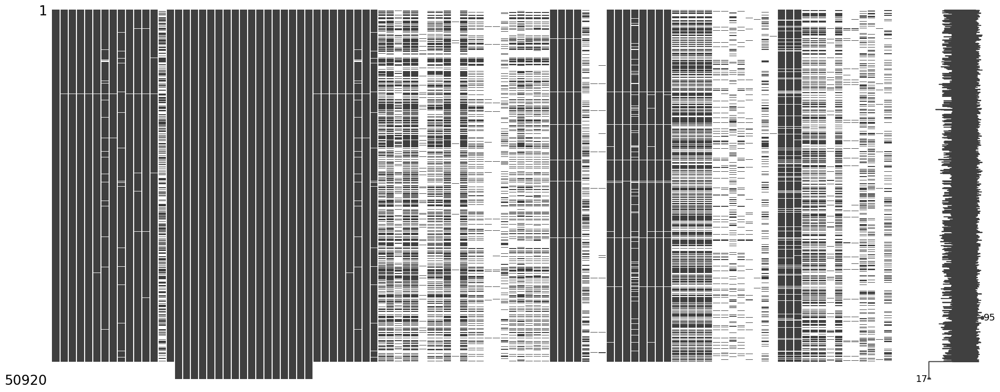

In [352]:
import missingno as msno #checked MCAR
#Mean Imputation
#When to Use: Suitable for continuous data where missing values are randomly distributed and the dataset is not highly skewed.
#Advantages: Simple to implement and maintains the mean of the dataset.
#Disadvantages: Reduces variance in the dataset and might introduce bias if the data is not missing completely at random (MCAR).

# Visualize the missingness
msno.matrix(X_df_full_filtered_norm_reduced)

Imbalanced checking on target: ~2

In [26]:
#aki binary not highly imbalanced, ratio ~2
y_df_full.value_counts()

1    34060
0    16860
Name: aki_binary, dtype: int64

#Feature Selection

#Strategy 1: only keep columns with < 10% missing values in the raw dataset

assign the target column to the DataFrame

In [27]:
# Concatenate for  alignment
df_full = pd.concat([X_df_full_filtered_norm_reduced, df_encoded['aki_binary']], axis=1)

# Verify alignment by checking the first few rows
df_full.info()
df_full.describe().transpose() #104 columns

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50920 entries, 0 to 50848
Data columns (total 104 columns):
 #    Column                                                 Dtype  
---   ------                                                 -----  
 0    admission_age                                          float64
 1    heart_rate_mean                                        float64
 2    sbp_mean                                               float64
 3    dbp_mean                                               float64
 4    mbp_mean                                               float64
 5    resp_rate_mean                                         float64
 6    temperature_mean                                       float64
 7    spo2_mean                                              float64
 8    glucose_mean                                           float64
 9    gcs_min                                                float64
 10   gcs_motor                                              f

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_mean,48449.0,-1.061070e-16,1.000000,-5.327681,-0.709986,-0.132120,0.609890,5.921957
dbp_mean,48449.0,-3.637115e-17,1.000000,-3.934994,-0.697077,-0.110646,0.595768,6.410630
mbp_mean,48430.0,-4.933306e-16,1.000000,-4.920839,-0.689273,-0.128741,0.590277,7.114758
...,...,...,...,...,...,...,...,...
ck_cpk_min_to_ck_cpk_max_diff,15030.0,-1.938274e-17,0.448719,-12.038458,-0.010010,0.003106,0.007868,22.817574
ck_mb_min_to_ck_mb_max_diff,13773.0,-5.158954e-18,0.591661,-6.841470,-0.067930,-0.047650,-0.027370,8.095306
ggt_min_to_ggt_max_diff,453.0,3.161562e-17,0.008615,-0.003688,-0.001056,-0.000972,-0.000946,0.114489
ld_ldh_min_to_ld_ldh_max_diff,13842.0,1.963463e-17,0.579218,-7.092462,-0.035956,0.000783,0.022492,37.231477


In [29]:

# Calculate the percentage of missing values for each column
missing_percent = df_full.isnull().sum() / len(df_full) * 100

# Identify columns where the percentage of missing values is greater than 10%
columns_to_drop = missing_percent[missing_percent > 10].index

# Drop these columns from the DataFrame
df_full_10 = df_full.drop(columns=columns_to_drop)
df_full_10.info()
df_full_10.describe().transpose()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50920 entries, 0 to 50848
Data columns (total 51 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   admission_age                                float64
 1   heart_rate_mean                              float64
 2   sbp_mean                                     float64
 3   dbp_mean                                     float64
 4   mbp_mean                                     float64
 5   resp_rate_mean                               float64
 6   temperature_mean                             float64
 7   spo2_mean                                    float64
 8   glucose_mean                                 float64
 9   gcs_min                                      float64
 10  gcs_motor                                    float64
 11  gcs_verbal                                   float64
 12  gcs_eyes                                     float64
 13  weight_admit    

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_mean,48449.0,-1.061070e-16,1.000000,-5.327681,-0.709986,-0.132120,0.609890,5.921957
dbp_mean,48449.0,-3.637115e-17,1.000000,-3.934994,-0.697077,-0.110646,0.595768,6.410630
mbp_mean,48430.0,-4.933306e-16,1.000000,-4.920839,-0.689273,-0.128741,0.590277,7.114758
resp_rate_mean,48394.0,4.241761e-16,1.000000,-3.499252,-0.698351,-0.167863,0.520999,6.876637
temperature_mean,46975.0,-7.554366e-15,1.000000,-19.143939,-0.438346,-0.029409,0.454043,6.091173
spo2_mean,48422.0,6.099674e-15,1.000000,-25.395562,-0.453214,0.107234,0.630842,1.298186
glucose_mean,47436.0,-4.493693e-18,1.000000,-0.032586,-0.022097,-0.019612,-0.016093,137.978058
gcs_min,48353.0,-1.027174e-16,1.000000,-4.014374,0.116961,0.492537,0.492537,0.492537


In [30]:
df_full_10 = df_full_10.dropna()
df_full_10.info()
df_full_10.describe().transpose() #44712 entries,51 col

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44712 entries, 0 to 50918
Data columns (total 51 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   admission_age                                float64
 1   heart_rate_mean                              float64
 2   sbp_mean                                     float64
 3   dbp_mean                                     float64
 4   mbp_mean                                     float64
 5   resp_rate_mean                               float64
 6   temperature_mean                             float64
 7   spo2_mean                                    float64
 8   glucose_mean                                 float64
 9   gcs_min                                      float64
 10  gcs_motor                                    float64
 11  gcs_verbal                                   float64
 12  gcs_eyes                                     float64
 13  weight_admit    

,count,mean,std,min,25%,50%,75%,max
admission_age,44712.0,-0.001129,0.996991,-2.723478,-0.602530,0.101692,0.763054,2.177929
heart_rate_mean,44712.0,0.004762,1.001845,-3.550964,-0.706353,-0.089047,0.636091,5.789234
sbp_mean,44712.0,0.018246,0.992610,-3.805658,-0.696251,-0.113309,0.630454,5.342624
dbp_mean,44712.0,0.011258,0.992353,-3.821523,-0.680581,-0.097408,0.602065,5.912343
mbp_mean,44712.0,0.013029,0.991234,-3.650735,-0.678071,-0.112662,0.605170,6.496737
resp_rate_mean,44712.0,0.005084,0.998726,-2.769606,-0.693251,-0.160923,0.528397,6.064611
temperature_mean,44712.0,0.008138,0.975980,-11.781734,-0.435204,-0.026716,0.458756,6.091173
spo2_mean,44712.0,0.007809,0.897918,-22.520851,-0.459495,0.093545,0.616842,1.298186
glucose_mean,44712.0,-0.000769,0.999942,-0.032034,-0.022179,-0.019620,-0.016065,137.978058
gcs_min,44712.0,0.010535,0.974983,-4.014374,0.116961,0.492537,0.492537,0.492537


feature

In [31]:

# List of columns intended to drop
X_columns_to_drop_10 = ['aki_binary'] #remove targets

X_df_10 = df_full_10.drop(columns=X_columns_to_drop_10, axis=1)

X_df_10.info()
X_df_10.describe().transpose() #50 features

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44712 entries, 0 to 50918
Data columns (total 50 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   admission_age                                float64
 1   heart_rate_mean                              float64
 2   sbp_mean                                     float64
 3   dbp_mean                                     float64
 4   mbp_mean                                     float64
 5   resp_rate_mean                               float64
 6   temperature_mean                             float64
 7   spo2_mean                                    float64
 8   glucose_mean                                 float64
 9   gcs_min                                      float64
 10  gcs_motor                                    float64
 11  gcs_verbal                                   float64
 12  gcs_eyes                                     float64
 13  weight_admit    

,count,mean,std,min,25%,50%,75%,max
admission_age,44712.0,-0.001129,0.996991,-2.723478,-0.602530,0.101692,0.763054,2.177929
heart_rate_mean,44712.0,0.004762,1.001845,-3.550964,-0.706353,-0.089047,0.636091,5.789234
sbp_mean,44712.0,0.018246,0.992610,-3.805658,-0.696251,-0.113309,0.630454,5.342624
dbp_mean,44712.0,0.011258,0.992353,-3.821523,-0.680581,-0.097408,0.602065,5.912343
mbp_mean,44712.0,0.013029,0.991234,-3.650735,-0.678071,-0.112662,0.605170,6.496737
resp_rate_mean,44712.0,0.005084,0.998726,-2.769606,-0.693251,-0.160923,0.528397,6.064611
temperature_mean,44712.0,0.008138,0.975980,-11.781734,-0.435204,-0.026716,0.458756,6.091173
spo2_mean,44712.0,0.007809,0.897918,-22.520851,-0.459495,0.093545,0.616842,1.298186
glucose_mean,44712.0,-0.000769,0.999942,-0.032034,-0.022179,-0.019620,-0.016065,137.978058
gcs_min,44712.0,0.010535,0.974983,-4.014374,0.116961,0.492537,0.492537,0.492537


target

In [32]:
y_df_10 = df_full_10['aki_binary']

y_df_10.info()

<class 'pandas.core.series.Series'>
Int64Index: 44712 entries, 0 to 50918
Series name: aki_binary
Non-Null Count  Dtype
--------------  -----
44712 non-null  int64
dtypes: int64(1)
memory usage: 698.6 KB


In [33]:
#aki binary not highly imbalanced, ratio ~2
y_df_10.value_counts()

1    29898
0    14814
Name: aki_binary, dtype: int64

In [34]:
# Train test split
X_train_10, X_test_10, y_train_10, y_test_10 = train_test_split(
    X_df_10,y_df_10,test_size=0.3,random_state=10,
    stratify=y_df_10, shuffle=True
)

#Strategy 2: only keep columns with < 50% missing values in the raw dataset

In [35]:

# Calculate the percentage of missing values for each column
missing_percent = df_full.isnull().sum() / len(df_full) * 100

# Identify columns where the percentage of missing values is greater than 10%
columns_to_drop_2 = missing_percent[missing_percent > 50].index

# Drop these columns from the DataFrame
df_full_50 = df_full.drop(columns=columns_to_drop_2)
df_full_50.info()
df_full_50.describe().transpose()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50920 entries, 0 to 50848
Data columns (total 66 columns):
 #   Column                                           Dtype  
---  ------                                           -----  
 0   admission_age                                    float64
 1   heart_rate_mean                                  float64
 2   sbp_mean                                         float64
 3   dbp_mean                                         float64
 4   mbp_mean                                         float64
 5   resp_rate_mean                                   float64
 6   temperature_mean                                 float64
 7   spo2_mean                                        float64
 8   glucose_mean                                     float64
 9   gcs_min                                          float64
 10  gcs_motor                                        float64
 11  gcs_verbal                                       float64
 12  gcs_eyes          

,count,mean,std,min,25%,50%,75%,max
admission_age,48511.0,2.731674e-17,1.000000,-2.723478,-0.601476,0.107172,0.767222,2.177929
heart_rate_mean,48456.0,-1.261076e-17,1.000000,-3.550964,-0.701713,-0.094688,0.620820,5.789234
sbp_mean,48449.0,-1.061070e-16,1.000000,-5.327681,-0.709986,-0.132120,0.609890,5.921957
dbp_mean,48449.0,-3.637115e-17,1.000000,-3.934994,-0.697077,-0.110646,0.595768,6.410630
mbp_mean,48430.0,-4.933306e-16,1.000000,-4.920839,-0.689273,-0.128741,0.590277,7.114758
...,...,...,...,...,...,...,...,...
abs_neutrophils_min_to_abs_neutrophils_max_diff,29379.0,4.045007e-16,0.353670,-2.305497,-0.130568,-0.073527,-0.020339,7.481346
inr_min_to_inr_max_diff,43702.0,3.232252e-16,0.761795,-20.548240,-0.125328,-0.030541,0.108335,24.009205
pt_min_to_pt_max_diff,43703.0,-7.771536e-17,0.766542,-10.869820,-0.147619,-0.021624,0.094999,13.753399
ptt_min_to_ptt_max_diff,43441.0,2.970340e-16,0.973150,-6.338304,-0.319104,-0.120763,0.084651,4.851364


In [36]:
df_full_50 = df_full_50.dropna()
df_full_50.info()
df_full_50.describe().transpose() #66 col, 13068 entries

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13068 entries, 0 to 50917
Data columns (total 66 columns):
 #   Column                                           Dtype  
---  ------                                           -----  
 0   admission_age                                    float64
 1   heart_rate_mean                                  float64
 2   sbp_mean                                         float64
 3   dbp_mean                                         float64
 4   mbp_mean                                         float64
 5   resp_rate_mean                                   float64
 6   temperature_mean                                 float64
 7   spo2_mean                                        float64
 8   glucose_mean                                     float64
 9   gcs_min                                          float64
 10  gcs_motor                                        float64
 11  gcs_verbal                                       float64
 12  gcs_eyes          

,count,mean,std,min,25%,50%,75%,max
admission_age,13068.0,0.002019,0.984137,-2.714607,-0.579733,0.108710,0.742665,2.032310
heart_rate_mean,13068.0,0.215923,1.039101,-3.550964,-0.523645,0.092868,0.897733,4.939852
sbp_mean,13068.0,-0.220132,0.919466,-3.805658,-0.853393,-0.371547,0.257837,4.300069
dbp_mean,13068.0,-0.154093,0.934115,-3.821523,-0.782465,-0.261753,0.368496,4.858343
mbp_mean,13068.0,-0.155520,0.922006,-3.650735,-0.772359,-0.289029,0.339386,5.458513
...,...,...,...,...,...,...,...,...
abs_neutrophils_min_to_abs_neutrophils_max_diff,13068.0,0.031333,0.438513,-1.819616,-0.141823,-0.079210,-0.002633,7.481346
inr_min_to_inr_max_diff,13068.0,0.058162,0.889450,-8.111527,-0.125328,-0.015845,0.144335,20.786468
pt_min_to_pt_max_diff,13068.0,0.069757,0.924421,-8.072122,-0.143148,0.006091,0.159492,13.753399
ptt_min_to_ptt_max_diff,13068.0,0.112587,1.020264,-6.338304,-0.281153,-0.073698,0.168756,4.851364


features

In [37]:
# List of columns intended to drop
X_columns_to_drop_50 = ['aki_binary'] #remove targets

X_df_50 = df_full_50.drop(columns=X_columns_to_drop_50, axis=1)

X_df_50.info()
X_df_50.describe().transpose() #65 features

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13068 entries, 0 to 50917
Data columns (total 65 columns):
 #   Column                                           Dtype  
---  ------                                           -----  
 0   admission_age                                    float64
 1   heart_rate_mean                                  float64
 2   sbp_mean                                         float64
 3   dbp_mean                                         float64
 4   mbp_mean                                         float64
 5   resp_rate_mean                                   float64
 6   temperature_mean                                 float64
 7   spo2_mean                                        float64
 8   glucose_mean                                     float64
 9   gcs_min                                          float64
 10  gcs_motor                                        float64
 11  gcs_verbal                                       float64
 12  gcs_eyes          

,count,mean,std,min,25%,50%,75%,max
admission_age,13068.0,0.002019,0.984137,-2.714607,-0.579733,0.108710,0.742665,2.032310
heart_rate_mean,13068.0,0.215923,1.039101,-3.550964,-0.523645,0.092868,0.897733,4.939852
sbp_mean,13068.0,-0.220132,0.919466,-3.805658,-0.853393,-0.371547,0.257837,4.300069
dbp_mean,13068.0,-0.154093,0.934115,-3.821523,-0.782465,-0.261753,0.368496,4.858343
mbp_mean,13068.0,-0.155520,0.922006,-3.650735,-0.772359,-0.289029,0.339386,5.458513
...,...,...,...,...,...,...,...,...
abs_monocytes_min_to_abs_monocytes_max_diff,13068.0,0.014972,0.488535,-12.612654,-0.120402,-0.017524,0.071520,27.009929
abs_neutrophils_min_to_abs_neutrophils_max_diff,13068.0,0.031333,0.438513,-1.819616,-0.141823,-0.079210,-0.002633,7.481346
inr_min_to_inr_max_diff,13068.0,0.058162,0.889450,-8.111527,-0.125328,-0.015845,0.144335,20.786468
pt_min_to_pt_max_diff,13068.0,0.069757,0.924421,-8.072122,-0.143148,0.006091,0.159492,13.753399


target

In [38]:
y_df_50 = df_full_50['aki_binary']

y_df_50.info()

<class 'pandas.core.series.Series'>
Int64Index: 13068 entries, 0 to 50917
Series name: aki_binary
Non-Null Count  Dtype
--------------  -----
13068 non-null  int64
dtypes: int64(1)
memory usage: 204.2 KB


imbalanced: SMOTE

In [39]:
#aki binary highly imbalanced, ratio >2
y_df_50.value_counts()

1    10150
0     2918
Name: aki_binary, dtype: int64

In [40]:
# Train test split
X_train_50, X_test_50, y_train_50, y_test_50 = train_test_split(
    X_df_50,y_df_50,test_size=0.3,random_state=10,
    stratify=y_df_50, shuffle=True
)

In [41]:
# Use imbalanced learn package
from imblearn.over_sampling import SMOTE

In [42]:
# Use SMOTE to resample minority class in training data
smote_sampler = SMOTE(random_state=12,sampling_strategy='minority')
X_df_50_SMOTE, y_df_50_SMOTE = smote_sampler.fit_resample(X_train_50, y_train_50)

#Feature selection logistics

Logistics regression with L1 regularisation for feature selection

In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

#Strategy 1

ElasticNet regularization

In [47]:
# Create the model with ElasticNet regularization
model = LogisticRegression(penalty='elasticnet', l1_ratio=0.5, solver='saga', max_iter=10000, random_state=42)

# Train the model
model.fit(X_train_10, y_train_10)


LogisticRegression(l1_ratio=0.5, max_iter=10000, penalty='elasticnet',
                   random_state=42, solver='saga')

In [48]:
# Evaluate the model
from sklearn.metrics import accuracy_score

y_pred_1 = model.predict(X_test_10)
accuracy_1 = accuracy_score(y_test_10, y_pred_1)
print(f"Accuracy: {accuracy_1}")


Accuracy: 0.7179066646786939


In [49]:
f1 = f1_score(y_test_10, y_pred_1)
print(f"F1 Score : {f1}")


F1 Score : 0.8102306920762287


In [50]:
# Predict probabilities
y_prob_1 = model.predict_proba(X_test_10)[:, 1]
# Compute AUC
auc_1 = roc_auc_score(y_test_10, y_prob_1)
print(f"AUC: {auc_1}")

AUC: 0.7320200247449493


In [51]:
import numpy as np

# Get the coefficients of the features
feature_importance = np.abs(model.coef_[0])

# Print the feature importance
for i, v in enumerate(feature_importance):
    print(f"Feature {i}: {v}")


Feature 0: 0.4089993882541831
Feature 1: 0.11229287908608182
Feature 2: 0.1680872571180862
Feature 3: 0.32002613401831476
Feature 4: 0.26947197605435175
Feature 5: 0.14042992654673978
Feature 6: 0.028099872084385344
Feature 7: 0.011936865064842254
Feature 8: 0.10539220854370088
Feature 9: 0.036813877763151044
Feature 10: 0.12901759499678017
Feature 11: 0.07279729780866344
Feature 12: 0.14438531160266627
Feature 13: 0.4886968234584406
Feature 14: 0.0
Feature 15: 0.05015657146113614
Feature 16: 0.1807946293122695
Feature 17: 0.06041421373648478
Feature 18: 0.011517692937962306
Feature 19: 0.027782998757681844
Feature 20: 0.02287714352308419
Feature 21: 0.0
Feature 22: 0.16380546541865262
Feature 23: 0.04433343091013584
Feature 24: 0.0
Feature 25: 0.19403587662523417
Feature 26: 0.0
Feature 27: 0.20969219992632765
Feature 28: 0.0
Feature 29: 0.0
Feature 30: 0.2769331342651724
Feature 31: 0.022795682901395126
Feature 32: 0.15016983945861143
Feature 33: 0.031789981154278536
Feature 34: 0.02

#Strategy 2

In [52]:
# Create the model with ElasticNet regularization
model = LogisticRegression(penalty='elasticnet', l1_ratio=0.5, solver='saga', max_iter=10000, random_state=42)

# Train the model
model.fit(X_df_50_SMOTE, y_df_50_SMOTE)


LogisticRegression(l1_ratio=0.5, max_iter=10000, penalty='elasticnet',
                   random_state=42, solver='saga')

In [53]:
# Evaluate the model
from sklearn.metrics import accuracy_score

y_pred_2 = model.predict(X_test_50)
accuracy_2 = accuracy_score(y_test_50, y_pred_2)
print(f"Accuracy: {accuracy_2}")


Accuracy: 0.7447079826574854


In [54]:
f1 = f1_score(y_test_50, y_pred_2)
print(f"F1 Score: {f1}")

F1 Score: 0.837579101087133


In [55]:
# Predict probabilities
y_prob_2 = model.predict_proba(X_test_50)[:, 1]
# Compute AUC
auc_2 = roc_auc_score(y_test_50, y_prob_2)
print(f"AUC: {auc_2}")

AUC: 0.7014549639726777


In [56]:
import numpy as np

# Get the coefficients of the features
feature_importance = np.abs(model.coef_[0])

# Print the feature importance
for i, v in enumerate(feature_importance):
    print(f"Feature {i}: {v}")


Feature 0: 0.44591383678489693
Feature 1: 0.09885409499300389
Feature 2: 0.09786349519953555
Feature 3: 0.12962350921620566
Feature 4: 0.04291653948566876
Feature 5: 0.11074347416595927
Feature 6: 0.03253126781171106
Feature 7: 0.00972273343471264
Feature 8: 0.02200521265109056
Feature 9: 0.04246192594563304
Feature 10: 0.2632823543274188
Feature 11: 0.017400063735966302
Feature 12: 0.2571819249203152
Feature 13: 0.59547096290757
Feature 14: 3.9752883801424206
Feature 15: 4.250009790721994
Feature 16: 4.673143278160099
Feature 17: 4.204091930937356
Feature 18: 4.4428908919977435
Feature 19: 4.786358434459978
Feature 20: 4.770665545987772
Feature 21: 1.3612899737548134
Feature 22: 1.985110405175665
Feature 23: 0.5683183564728764
Feature 24: 0.3131068476437971
Feature 25: 3.0629573581877696
Feature 26: 2.4971634524898634
Feature 27: 3.4374627299295306
Feature 28: 2.884523169181311
Feature 29: 1.1620048608103049
Feature 30: 1.2925262464618144
Feature 31: 0.06045821555103077
Feature 32: 0.

Logistic regression assumes a linear relationship between the log-odds of the outcome and the input features. If your data is indeed non-linearly separable, logistic regression might struggle to capture the underlying patterns effectively, potentially affecting the ROC AUC. However, a high F1 score indicates that the model performs well at a specific threshold, suggesting that the model has found a linear decision boundary that works well in certain contexts.A high F1 score means the chosen threshold leads to a good balance of precision and recall. It's possible to achieve a high F1 score with a model that doesn't generalize well across all thresholds (as evaluated by ROC AUC) if the data or the model's predictions align well at that specific threshold

#Predictive models with selected features, namely strategy 1

data is not linearly seperable

In [57]:
# We will use the following packages

# NumPy for math operations, and Pandas for processing tabular data.
import numpy as np
import pandas as pd

# Plotly plotting package
import plotly.graph_objects as go
import plotly.express as px

# Tools in sklearn to select best model
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV

# Decision tree classifier in sklearn
from sklearn.tree import DecisionTreeClassifier as DTC, plot_tree

# We use f1 score to test model performance
from sklearn.metrics import f1_score

# Import matplotlib.pyplot to visualize tree models
import matplotlib.pyplot as plt

#XGboost
from xgboost import XGBClassifier as XGBC

# Support Vector Classifier
from sklearn.svm import SVC

#Decision Tree

In [85]:
# We use `GridSearchCV` to select the best `max_depth`.

parameters = {'max_depth':np.arange(start=2,stop=10,step=1)}
parameters

{'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9])}

In [86]:
stratifiedCV = StratifiedKFold(n_splits=8)
TreeModel = DTC(criterion='entropy', class_weight='balanced')
BestTree = GridSearchCV(
    TreeModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV
)
BestTree.fit(X_train_10,y_train_10)

GridSearchCV(cv=StratifiedKFold(n_splits=8, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy'),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [87]:
BestTree.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=8)

In [88]:
BestTree.best_score_

0.6963572798623648

In [89]:
y_pred_DTC = BestTree.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_DTC)))
pd.crosstab(y_test_10,y_pred_DTC)

F1 score on test set: 0.6976


col_0,0,1
aki_binary,,
0,2928,1516
1,3354,5616


#gradient boosting tree model

In [90]:
parameters = {
    'n_estimators':np.arange(start=2,stop=20,step=2),
    'max_depth':np.arange(start=2,stop=6,step=1),
    'learning_rate':np.arange(start=0.05,stop=0.4,step=0.05)
}

parameters

{'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
 'max_depth': array([2, 3, 4, 5]),
 'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35])}

In [91]:
# Calculate the scale_pos_weight for XGBoost
positive_cases = 29898
negative_cases = 14814
scale_pos_weight = negative_cases / positive_cases

In [92]:
stratifiedCV = StratifiedKFold(n_splits=3)
# XGBC: XGBoost classifier
XGBoostModel = XGBC(scale_pos_weight=scale_pos_weight)
BestXGBoost = GridSearchCV(
    XGBoostModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1 # use all cpu cores to speedup grid search
)
BestXGBoost.fit(X_train_10,y_train_10)

Fitting 3 folds for each of 252 candidates, totalling 756 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'max_depth': array([2, 3, 4, 5]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1', verbose=1)

In [93]:
BestXGBoost.best_params_

{'learning_rate': 0.25, 'max_depth': 2, 'n_estimators': 2}

In [94]:
BestXGBoost.best_score_

0.7466435338455911

In [95]:
y_pred_XG = BestXGBoost.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_XG)))
pd.crosstab(y_test_10,y_pred_XG)

F1 score on test set: 0.7291


col_0,0,1
aki_binary,,
0,2350,2094
1,2623,6347


#SVM: linear kernel

imbalanced class weights

In [68]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':[0.01, 0.1, 1, 10, 100]
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='linear')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1
)
BestSVC.fit(X_train_10,y_train_10)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(kernel='linear'), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100]}, scoring='f1',
             verbose=1)

In [69]:
BestSVC.best_estimator_

SVC(C=0.01, kernel='linear')

In [70]:
BestSVC.best_score_

0.8104832109497814

In [71]:

y_pred_SVM_linear = BestSVC.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_SVM_linear)))
pd.crosstab(y_test_10,y_pred_SVM_linear)

F1 score on test set: 0.8117


col_0,0,1
aki_binary,,
0,1188,3256
1,619,8351


balanced class weights

In [96]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':[ 0.1, 1, 10]
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='linear', class_weight='balanced')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1
)
BestSVC.fit(X_train_10,y_train_10)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(class_weight='balanced', kernel='linear'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10]}, scoring='f1', verbose=1)

In [97]:
BestSVC.best_estimator_

SVC(C=0.1, class_weight='balanced', kernel='linear')

In [98]:
BestSVC.best_score_

0.727233913105957

In [99]:
y_pred_SVM_linear_2 = BestSVC.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_SVM_linear_2)))
pd.crosstab(y_test_10,y_pred_SVM_linear_2)

F1 score on test set: 0.7296


col_0,0,1
aki_binary,,
0,3013,1431
1,2996,5974


#SVM to rbf kernel

imbalanced class weight

In [72]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':[0.1, 1, 10]
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='rbf')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    n_jobs=-1
)
BestSVC.fit(X_train_10,y_train_10)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(), n_jobs=-1, param_grid={'C': [0.1, 1, 10]},
             scoring='f1')

In [73]:
BestSVC.best_estimator_

SVC(C=0.1)

In [74]:
BestSVC.best_score_

0.8156949307144555

In [75]:
y_pred_SVM_rbf = BestSVC.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_SVM_rbf)))
pd.crosstab(y_test_10,y_pred_SVM_rbf)

F1 score on test set: 0.8153


col_0,0,1
aki_binary,,
0,1129,3315
1,515,8455


adjust C based on best estimator

In [76]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':np.arange(0.05,0.35,step=0.1)
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='rbf')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    n_jobs=-1
)
BestSVC.fit(X_train_10,y_train_10)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': array([0.05, 0.15, 0.25])}, scoring='f1')

In [77]:
BestSVC.best_estimator_

SVC(C=0.25000000000000006)

In [78]:
BestSVC.best_score_

0.8157625699925698

In [79]:
y_pred_SVM_rbf_2 = BestSVC.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_SVM_rbf_2)))
pd.crosstab(y_test_10,y_pred_SVM_rbf_2)

F1 score on test set: 0.8149


col_0,0,1
aki_binary,,
0,1209,3235
1,577,8393


imbalance data

In [80]:
# 'C': strength of L2 regularization on linear SVM. Larger 'C' --> smaller regularization.
parameters = {
    'C':np.arange(0.05,0.35,step=0.1)
}
stratifiedCV = StratifiedKFold(n_splits=3)
SVCModel = SVC(kernel='rbf', class_weight='balanced')
BestSVC = GridSearchCV(
    SVCModel,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    n_jobs=-1
)
BestSVC.fit(X_train_10,y_train_10)

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(class_weight='balanced'), n_jobs=-1,
             param_grid={'C': array([0.05, 0.15, 0.25])}, scoring='f1')

In [81]:
BestSVC.best_estimator_

SVC(C=0.05, class_weight='balanced')

In [82]:
BestSVC.best_score_

0.7501893712467846

In [83]:
y_pred_SVM_rbf_3 = BestSVC.predict(X_test_10)
print('F1 score on test set: {:.4f}'.format(f1_score(y_test_10,y_pred_SVM_rbf_3)))
pd.crosstab(y_test_10,y_pred_SVM_rbf_3)

F1 score on test set: 0.7479


col_0,0,1
aki_binary,,
0,2799,1645
1,2630,6340
